<h1 align = 'center'>Intrusion Detection In Wireless Sensor Networks</h1>
<hr>


<img src="https://psiborg.in/wp-content/uploads/2021/07/Embedded-banner-2048_11zon-1.jpg" alt="wsn-google-image" width="1000" height="1000">
<br>
<code>img credit: psiborg</code>


In [2]:
#primary utils
import numpy as np
import pandas as pd
from pandas_profiling import profile_report
from pandas.plotting import scatter_matrix
import seaborn as sns
import matplotlib.pyplot as plt


#sklearn
import sklearn
from sklearn.preprocessing import FunctionTransformer,LabelEncoder

from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import (train_test_split,
                                     GridSearchCV,
                                     RepeatedStratifiedKFold,
                                     cross_val_score)

from sklearn.metrics import (precision_recall_curve,
                             precision_recall_fscore_support,
                             roc_auc_score,
                             plot_confusion_matrix,
                             roc_curve,
                             precision_score,
                             recall_score,
                             accuracy_score,
                             plot_precision_recall_curve)

#models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier

# -- xgboost
import xgboost
from xgboost import XGBClassifier

#torch 
from torch import nn
from skorch import NeuralNetClassifier

# -- stacking
import mlxtend
from mlxtend.classifier import StackingClassifier

#imblean tools for handling imablaced dataset
import imblearn
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE,BorderlineSMOTE,ADASYN 
from imblearn.under_sampling import RandomUnderSampler

#other
import warnings
warnings.filterwarnings("ignore")
from collections import Counter

#wandb - logging
import wandb

In [3]:
print("sklean version :", sklearn.__version__)
print("imblearn version :", imblearn.__version__)
print("wandb version :", wandb.__version__)
print("pandas :",pd.__version__)
print("numpy :",np.__version__)
print("seaborn :", sns.__version__)
print("mlxtend :", mlxtend.__version__)
print("xgboost :",xgboost.__version__)

sklean version : 1.1.3
imblearn version : 0.9.1
wandb version : 0.13.4
pandas : 1.4.4
numpy : 1.23.3
seaborn : 0.12.0
mlxtend : 0.21.0
xgboost : 1.5.0


In [4]:
# wandb.login(force = True)

In [5]:
# run = wandb.init(project="wsn-intrusion-detection", entity="mk-armah")

In [6]:
df = pd.read_csv("./WSN-DS.csv")
df.head(10)

,id,Time,Is_CH,who CH,Dist_To_CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,dist_CH_To_BS,send_code,Expaned Energy,Attack type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal
5,101005,50,0,101010,31.91198,0,4,1,0,0,1,18,41,0,0,0.00000,3,0.06717,Normal
6,101006,50,0,101044,24.34167,0,4,1,0,0,1,5,38,0,0,0.00000,4,0.06214,Normal
7,101007,50,0,101010,26.75033,0,4,1,0,0,1,21,41,0,0,0.00000,3,0.06662,Normal
8,101008,50,0,101044,63.66485,0,4,1,0,0,1,17,38,0,0,0.00000,4,0.06649,Normal
9,101009,50,0,101000,32.90217,0,4,1,0,0,1,12,48,0,0,0.00000,1,0.07903,Normal


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0    id               374661 non-null  int64  
 1    Time             374661 non-null  int64  
 2    Is_CH            374661 non-null  int64  
 3    who CH           374661 non-null  int64  
 4    Dist_To_CH       374661 non-null  float64
 5    ADV_S            374661 non-null  int64  
 6    ADV_R            374661 non-null  int64  
 7    JOIN_S           374661 non-null  int64  
 8    JOIN_R           374661 non-null  int64  
 9    SCH_S            374661 non-null  int64  
 10   SCH_R            374661 non-null  int64  
 11  Rank              374661 non-null  int64  
 12   DATA_S           374661 non-null  int64  
 13   DATA_R           374661 non-null  int64  
 14   Data_Sent_To_BS  374661 non-null  int64  
 15   dist_CH_To_BS    374661 non-null  float64
 16   send_code        37

In [8]:
df.dtypes

 id                   int64
 Time                 int64
 Is_CH                int64
 who CH               int64
 Dist_To_CH         float64
 ADV_S                int64
 ADV_R                int64
 JOIN_S               int64
 JOIN_R               int64
 SCH_S                int64
 SCH_R                int64
Rank                  int64
 DATA_S               int64
 DATA_R               int64
 Data_Sent_To_BS      int64
 dist_CH_To_BS      float64
 send_code            int64
Expaned Energy      float64
Attack type          object
dtype: object

In [9]:
df.describe(include = int)

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,3.746610e+05,374661.000000,374661.000000,3.746610e+05,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000,374661.000000
mean,2.749693e+05,1064.748712,0.115766,2.749804e+05,0.267698,6.940562,0.779905,0.737493,0.288984,0.747452,9.687104,44.857925,73.890045,4.569448,2.497957
std,3.898986e+05,899.646164,0.319945,3.899112e+05,2.061148,7.044319,0.414311,4.691498,2.754746,0.434475,14.681901,42.574464,230.246335,19.679155,2.407337
min,1.010000e+05,50.000000,0.000000,1.010000e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.070930e+05,353.000000,0.000000,1.070960e+05,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,13.000000,0.000000,0.000000,1.000000
50%,1.160710e+05,803.000000,0.000000,1.160720e+05,0.000000,5.000000,1.000000,0.000000,0.000000,1.000000,3.000000,35.000000,0.000000,0.000000,2.000000
75%,2.150720e+05,1503.000000,0.000000,2.150730e+05,0.000000,7.000000,1.000000,0.000000,0.000000,1.000000,13.000000,62.000000,0.000000,0.000000,4.000000
max,3.402096e+06,3600.000000,1.000000,3.402100e+06,97.000000,117.000000,1.000000,124.000000,99.000000,1.000000,99.000000,241.000000,1496.000000,241.000000,15.000000


In [10]:
df.select_dtypes('int').astype(pd.CategoricalDtype()).describe()

,id,Time,Is_CH,who CH,ADV_S,ADV_R,JOIN_S,JOIN_R,SCH_S,SCH_R,Rank,DATA_S,DATA_R,Data_Sent_To_BS,send_code
count,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661,374661
unique,11120,196,2,7088,85,31,2,101,95,2,100,192,1345,237,16
top,101000,53,0,202100,0,4,1,0,0,1,1,0,0,0,0
freq,139,13600,331288,3554,331288,53971,292200,355792,355804,280041,96148,60340,319114,308061,82461


In [11]:
df.select_dtypes(float).describe()

,Dist_To_CH,dist_CH_To_BS,Expaned Energy
count,374661.000000,374661.000000,374661.000000
mean,22.599380,22.562735,0.305661
std,21.955794,50.261604,0.669462
min,0.000000,0.000000,0.000000
25%,4.735440,0.000000,0.056150
50%,18.372610,0.000000,0.097970
75%,33.776000,0.000000,0.217760
max,214.274620,201.934940,45.093940


In [12]:
df.columns

Index([' id', ' Time', ' Is_CH', ' who CH', ' Dist_To_CH', ' ADV_S', ' ADV_R',
       ' JOIN_S', ' JOIN_R', ' SCH_S', ' SCH_R', 'Rank', ' DATA_S', ' DATA_R',
       ' Data_Sent_To_BS', ' dist_CH_To_BS', ' send_code ', 'Expaned Energy',
       'Attack type'],
      dtype='object')

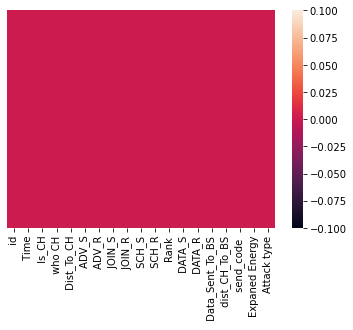

In [15]:
sns.heatmap(df.isna(),yticklabels = False);

In [13]:
lower = lambda x: [i.lower().lstrip() for i in x] #make columns lower case and strip off left whitespacespaces

# df.columns = [x.lower().lstrip() for x in df.columns] 
df.columns = lower(df.columns)

df.columns = [x.replace(' ',"_") for x in df.columns] #replace all spaces in column names with underscore

In [14]:
df.columns

Index(['id', 'time', 'is_ch', 'who_ch', 'dist_to_ch', 'adv_s', 'adv_r',
       'join_s', 'join_r', 'sch_s', 'sch_r', 'rank', 'data_s', 'data_r',
       'data_sent_to_bs', 'dist_ch_to_bs', 'send_code_', 'expaned_energy',
       'attack_type'],
      dtype='object')

In [15]:
df.head()

,id,time,is_ch,who_ch,dist_to_ch,adv_s,adv_r,join_s,join_r,sch_s,sch_r,rank,data_s,data_r,data_sent_to_bs,dist_ch_to_bs,send_code_,expaned_energy,attack_type
0,101000,50,1,101000,0.00000,1,0,0,25,1,0,0,0,1200,48,130.08535,0,2.46940,Normal
1,101001,50,0,101044,75.32345,0,4,1,0,0,1,2,38,0,0,0.00000,4,0.06957,Normal
2,101002,50,0,101010,46.95453,0,4,1,0,0,1,19,41,0,0,0.00000,3,0.06898,Normal
3,101003,50,0,101044,64.85231,0,4,1,0,0,1,16,38,0,0,0.00000,4,0.06673,Normal
4,101004,50,0,101010,4.83341,0,4,1,0,0,1,25,41,0,0,0.00000,3,0.06534,Normal


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374661 entries, 0 to 374660
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               374661 non-null  int64  
 1   time             374661 non-null  int64  
 2   is_ch            374661 non-null  int64  
 3   who_ch           374661 non-null  int64  
 4   dist_to_ch       374661 non-null  float64
 5   adv_s            374661 non-null  int64  
 6   adv_r            374661 non-null  int64  
 7   join_s           374661 non-null  int64  
 8   join_r           374661 non-null  int64  
 9   sch_s            374661 non-null  int64  
 10  sch_r            374661 non-null  int64  
 11  rank             374661 non-null  int64  
 12  data_s           374661 non-null  int64  
 13  data_r           374661 non-null  int64  
 14  data_sent_to_bs  374661 non-null  int64  
 15  dist_ch_to_bs    374661 non-null  float64
 16  send_code_       374661 non-null  int6

In [17]:
not_duplicated = len(df) - len(df[df.duplicated()])
duplicated = len(df) - not_duplicated

print("total number of duplicated rows: ",duplicated)

print("percentage duplicated: {}%".format(round((len(df[df.duplicated()])/len(df))*100,3)))

total number of duplicated rows:  8873
percentage duplicated: 2.368%


In [18]:
len(df) - len(df[df.id.duplicated()])

11120

In [23]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

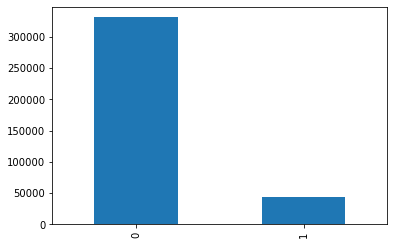

In [24]:
#is_ch; A flag to distinguish whether the node is CH with value 1 or normal node with value 0.
#how many channels are present


df['is_ch'].value_counts().plot(kind = 'bar')

In [22]:
df.attack_type.unique()

array(['Normal', 'Flooding', 'TDMA', 'Grayhole', 'Blackhole'],
      dtype=object)

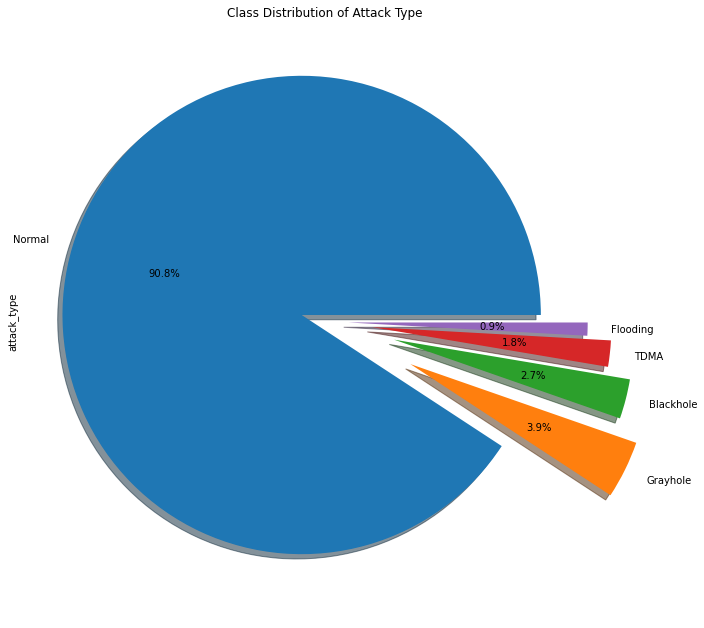

In [20]:
#category distribution
plt.figure(figsize = (11,11))
df['attack_type'].value_counts().plot(kind = 'pie',explode = [0.1,0.4,0.3,0.2,0.1],shadow = True,autopct = '%1.1f%%');
plt.title("Class Distribution of Attack Type");

In [21]:
df.select_dtypes(float)

,dist_to_ch,dist_ch_to_bs,expaned_energy
0,0.00000,130.08535,2.46940
1,75.32345,0.00000,0.06957
2,46.95453,0.00000,0.06898
3,64.85231,0.00000,0.06673
4,4.83341,0.00000,0.06534
...,...,...,...
374656,6.98337,170.14779,0.15974
374657,29.32867,82.21043,0.06877
374658,18.51963,139.26438,0.09437
374659,8.55001,158.27492,0.16047


<Figure size 792x720 with 0 Axes>

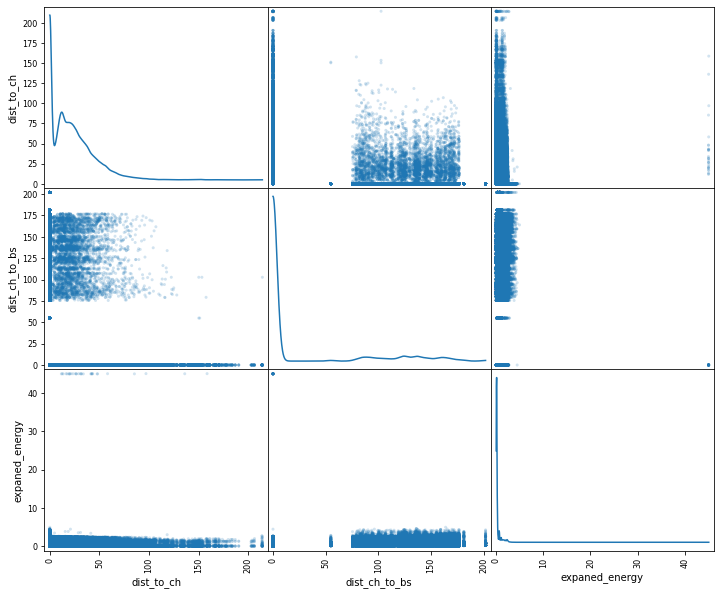

In [22]:
plt.figure(figsize = (11,10));
scatter_matrix(df.select_dtypes(float),figsize = (12,10),grid = True,diagonal = 'kde',alpha = 0.2);

# Assessment Report 
<ul>
    <li>No missing data was found</li>
    <li>2.368% of the data has been found to be duplicated, thats a total of 8873</li>
    <li>Target or predictand is heavily imbalanced, with 'Normal' being the model class covering over 90% samples</li>
</ul>

# Data Splitting and Preprocessing

<hr>

In [19]:
drop_duplicates =  lambda x:x.drop_duplicates()
df = drop_duplicates(df)

In [20]:
#drop_duplicates =  lambda x:x.drop_duplicates() #works but note that lambda functions are not pickleable

def drop_duplicates(X,y):
    """drop duplicates in x
    
    Args:
        X:pandas.DataFrame
    Return:
        pandas.DataFrame | pandas dataframe containing no duplicated values
        """
    data = pd.concat([X,y],axis = 1)
    return data.drop_duplicates()

In [21]:
df.shape

(365788, 19)

In [22]:
#defining features and target variables

X = df.drop(columns = ['attack_type','id','who_ch','time'],axis = 1)
y = df['attack_type']

In [23]:
#applying data splitting with stratified sampling on the target variable due to class imbalance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42,stratify = y)

In [24]:
print("samples available for training: ", len(X_train))
print("samples available for testing : ", len(X_test))

samples available for training:  256051
samples available for testing :  109737


In [25]:
X_train.head(2)

,is_ch,dist_to_ch,adv_s,adv_r,join_s,join_r,sch_s,sch_r,rank,data_s,data_r,data_sent_to_bs,dist_ch_to_bs,send_code_,expaned_energy
30124,0,22.4123,0,28,1,0,0,1,14,0,684,0,0.00000,1,2.06403
288709,0,0.0000,0,4,0,0,0,0,7,10,1106,10,168.61919,0,1.42318


In [ ]:
df[]

In [26]:
df['is_ch'].unique()

array([1, 0], dtype=int64)

In [28]:
df['dist_to_ch'].max() #numerical

214.27462

In [29]:
df['adv_s'].unique()

array([ 1,  0,  7,  6,  4,  8,  3,  9,  5, 16, 11, 13, 19, 10, 14, 15, 17,
       12, 18, 20, 24, 22, 21, 23, 38, 32, 36, 48, 37, 49, 25, 28, 26, 35,
       39, 33, 43, 41, 40, 46, 29, 42, 31, 47, 27, 44, 45, 30, 34, 60, 80,
       57, 75, 50, 96, 53, 61, 73, 69, 82, 83, 79, 63, 67, 88, 71, 70, 97,
       76, 84, 91, 66, 59, 92, 81, 56, 93, 90, 87, 51, 78, 52, 74, 72, 77],
      dtype=int64)

In [31]:
df['adv_r'].unique()

array([  0,   4,   2,   1,   3,   7,   6,   5,  12,  11,   8,   9,  10,
        16,  15,  17,  20,  14,  19,  22,  21,  18,  23,  27,  24,  26,
        25,  28,  13, 117,  29], dtype=int64)

In [33]:
df['join_s'].unique()


array([0, 1], dtype=int64)

In [34]:
df['join_r'].unique()


array([ 25,   0,  30,   8,  33,  56,  42,  20,  48,  29,  32,  66,  15,
        12,   9,  18,  13,  14,  16,  27,   6,   5,  28,  50,  26,  19,
         4,  44,  46,   2,  11,  10,  23,  99,  17,   1,   3,   7,  24,
        21,  22,  35,  31,  63,  55,  51,  41,  61,  40,  90,  54,  47,
        82,  80,  38,  75,  39,  72,  62,  64,  36,  70,  52,  71,  85,
        67,  49,  59,  60,  45,  95,  93,  98, 124,  97,  73,  57,  89,
        34,  43,  69,  87,  53,  37,  58,  96,  76,  65,  79,  86,  78,
        68,  74,  88,  77,  91,  84,  81,  94,  92,  83], dtype=int64)

In [53]:
#df['data_s'].unique()
#df['data_r'].unique()
#df['data_sent_to_bs'].unique()
#df['dist_ch_to_bs'].unique()
#df['send_code_'].max()
#df['expaned_energy'].unique()

15

In [38]:
df['sch_s'].unique()
df['sch_r'].unique()


array([0, 1], dtype=int64)

In [40]:
df['rank'].max()

99

In [29]:
#log distribution of the trainnig data to weights and biases (wandb)

# wandb.sklearn.plot_class_proportions(y_train, y_test, list(y.unique()))

In [30]:
#plot data distribution for training and testing datasets

In [29]:
#initialize sampling strategies to handlle imbalanced target classes

over = SMOTE(sampling_strategy='not majority', k_neighbors=5,random_state=42)

undersample = RandomUnderSampler(sampling_strategy= {'Normal':10217},random_state=42)

borderline_oversample  = BorderlineSMOTE(random_state=111) #variant of smote | oversampling technique

undersample_all = RandomUnderSampler(sampling_strategy = 'all',random_state=42)

## UTILS

In [32]:
import re
pattern= "detection_speed_(.*)"
match = re.search(pattern,"detection_speed_naive_bayes")
if match:
    content = match.group(1)
    new_content = re.sub('_'," ",content)
    print(new_content)

naive bayes


In [33]:
import time
import re

def Calc_Detection_Speed(func):
    def wrap():
        times = []
        for i in range(100):
            start_time = time.time()
            func().predict(X_test.values.astype(np.float32)) #score the testing data
            times.append(time.time() - start_time)
        avg_inf_time = np.mean(times)
        
        pattern= "ds_(.*)"
        match = re.search(pattern,func.__name__)

        if match:
            content = match.group(1)
            algorithm = re.sub('_'," ",content)
            formatted_results = algorithm+ " Classifier has an average speed of : {}s".format(round(avg_inf_time,3))
        else:
            print("Unrecognized Algorithm naming convention")
            
        return formatted_results
    
    return wrap

In [73]:
def prfs_metrics(y_true,y_pred,labels:list = None):
    labels = np.unique(y_true) if labels is None else labels
    metrics = pd.DataFrame(

        precision_recall_fscore_support(
                y_true,y_pred,
                labels = labels
        ),

        columns = y_true.unique() if labels is None else labels,
        index = ['precision',
                 'recall',
                 'F-measure',
                 'support']
    )

    return metrics

## K Nearest Neigbors Algorithm

In [32]:
#knn model
knn_model = KNeighborsClassifier(n_neighbors = 5) 

#construct pipeline steps
knn_steps = [('sampling', undersample_all),  ('model',knn_model)]

In [33]:
knn_pipeline = Pipeline(steps= knn_steps)
knn_pipeline

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [58]:
#Hyper Parameters
knn_pipeline.get_params()

{'memory': None,
 'steps': [('sampling', RandomUnderSampler(sampling_strategy='all')),
  ('model', KNeighborsClassifier())],
 'verbose': False,
 'sampling': RandomUnderSampler(sampling_strategy='all'),
 'model': KNeighborsClassifier(),
 'sampling__random_state': None,
 'sampling__replacement': False,
 'sampling__sampling_strategy': 'all',
 'model__algorithm': 'auto',
 'model__leaf_size': 30,
 'model__metric': 'minkowski',
 'model__metric_params': None,
 'model__n_jobs': None,
 'model__n_neighbors': 5,
 'model__p': 2,
 'model__weights': 'uniform'}

In [59]:
knn_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', RandomUnderSampler(sampling_strategy='all')),
                ('model', KNeighborsClassifier())])

In [60]:
knn_pipeline.score(X_test,y_test)

0.7724377374996583

### Model Tuning - KNN

In [97]:
#parameters for tuning
params = {
    'model__n_neighbors':list(range(1,12,2)),
    'model__metric':['euclidean','cosine','manhattan','l1','l2'],
    'sampling':[over,borderline_oversample]
}

gscv = GridSearchCV(estimator = knn_pipeline,param_grid = params,scoring = 'accuracy',cv = 5,verbose = 3)
gscv

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('sampling',
                                        RandomUnderSampler(sampling_strategy='all')),
                                       ('model', KNeighborsClassifier())]),
             param_grid={'model__metric': ['euclidean', 'cosine', 'manhattan',
                                           'l1', 'l2'],
                         'model__n_neighbors': [1, 3, 5, 7, 9, 11],
                         'sampling': [SMOTE(sampling_strategy='not majority'),
                                      BorderlineSMOTE()]},
             scoring='accuracy', verbose=3)

In [69]:
#35 hours+ tuning time... Do not run, unless under extremely necessary situations

# gscv.fit(X_train,y_train) 

Fitting 10 folds for each of 60 candidates, totalling 600 fits
[CV 1/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 1.6min
[CV 2/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time=  32.0s
[CV 3/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time=  27.5s
[CV 4/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time=  27.9s
[CV 5/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.973 total time=  29.9s
[CV 6/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time=  31.2s
[CV 7/10] END model__metric=euclidean, model__n_neighbors=1, sampling=SMOTE(sam

[CV 3/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  28.2s
[CV 4/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  28.7s
[CV 5/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  28.3s
[CV 6/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.959 total time=  30.5s
[CV 7/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  30.7s
[CV 8/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.958 total time=  32.8s
[CV 9/10] END model__metric=euclidean, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.957 total time=  32.1s

[CV 5/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.977 total time= 7.1min
[CV 6/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 7.0min
[CV 7/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time= 7.3min
[CV 8/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.976 total time= 7.0min
[CV 9/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.978 total time= 7.0min
[CV 10/10] END model__metric=cosine, model__n_neighbors=1, sampling=SMOTE(sampling_strategy='not majority');, score=0.977 total time= 7.2min
[CV 1/10] END model__metric=cosine, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 7.1min
[CV 2/10] END model__metric=cosine, model

[CV 9/10] END model__metric=cosine, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.962 total time= 9.1min
[CV 10/10] END model__metric=cosine, model__n_neighbors=7, sampling=SMOTE(sampling_strategy='not majority');, score=0.961 total time= 8.9min
[CV 1/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.969 total time= 8.0min
[CV 2/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.965 total time= 9.0min
[CV 3/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.967 total time= 9.5min
[CV 4/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.967 total time= 9.0min
[CV 5/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.968 total time= 9.9min
[CV 6/10] END model__metric=cosine, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.969 total time=10.2min
[CV 7/10] E

[CV 2/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.4min
[CV 3/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.5min
[CV 4/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.984 total time= 1.4min
[CV 5/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.983 total time= 1.4min
[CV 6/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.5min
[CV 7/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.983 total time= 1.6min
[CV 8/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 9/10] END model__metric=manhattan, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 10/10] END model__metric=man

[CV 5/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.3min
[CV 6/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.977 total time= 1.5min
[CV 7/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.973 total time= 1.3min
[CV 8/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.3min
[CV 9/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.976 total time= 1.4min
[CV 10/10] END model__metric=manhattan, model__n_neighbors=7, sampling=BorderlineSMOTE();, score=0.975 total time= 1.5min
[CV 1/10] END model__metric=manhattan, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.4min
[CV 2/10] END model__metric=manhattan, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.965 total 

[CV 9/10] END model__metric=l1, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 10/10] END model__metric=l1, model__n_neighbors=1, sampling=BorderlineSMOTE();, score=0.985 total time= 1.4min
[CV 1/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.975 total time= 1.4min
[CV 2/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time= 1.4min
[CV 3/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.973 total time= 2.3min
[CV 4/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.974 total time= 6.2min
[CV 5/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.972 total time= 2.3min
[CV 6/10] END model__metric=l1, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not

[CV 5/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.963 total time= 1.2min
[CV 6/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.3min
[CV 7/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.963 total time= 1.3min
[CV 8/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.964 total time= 1.2min
[CV 9/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.965 total time= 1.2min
[CV 10/10] END model__metric=l1, model__n_neighbors=9, sampling=SMOTE(sampling_strategy='not majority');, score=0.966 total time= 1.3min
[CV 1/10] END model__metric=l1, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.973 total time= 1.3min
[CV 2/10] END model__metric=l1, model__n_neighbors=9, sampling=Border

[CV 10/10] END model__metric=l2, model__n_neighbors=3, sampling=SMOTE(sampling_strategy='not majority');, score=0.968 total time= 1.2min
[CV 1/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.979 total time= 1.4min
[CV 2/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.978 total time= 1.3min
[CV 3/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.977 total time= 1.3min
[CV 4/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.977 total time= 1.3min
[CV 5/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.976 total time= 1.3min
[CV 6/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.978 total time= 1.3min
[CV 7/10] END model__metric=l2, model__n_neighbors=3, sampling=BorderlineSMOTE();, score=0.976 total time= 1.3min
[CV 8/10] END model__metric=l2, model__n_neighbors=3, sampling=Bo

[CV 6/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 7/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.965 total time= 1.3min
[CV 8/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.965 total time= 1.3min
[CV 9/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 10/10] END model__metric=l2, model__n_neighbors=9, sampling=BorderlineSMOTE();, score=0.968 total time= 1.3min
[CV 1/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.954 total time= 1.8min
[CV 2/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.952 total time= 1.2min
[CV 3/10] END model__metric=l2, model__n_neighbors=11, sampling=SMOTE(sampling_strategy='not majority');, score=0.952 total time= 1.2min
[CV 4/10] END mode

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('sampling',
                                        RandomUnderSampler(sampling_strategy='all')),
                                       ('model', KNeighborsClassifier())]),
             param_grid={'model__metric': ['euclidean', 'cosine', 'manhattan',
                                           'l1', 'l2'],
                         'model__n_neighbors': [1, 3, 5, 7, 9, 11],
                         'sampling': [SMOTE(sampling_strategy='not majority'),
                                      BorderlineSMOTE()]},
             scoring='accuracy', verbose=3)

In [70]:
gscv.score(X_test,y_test)

0.9855928264851418

In [80]:
gscv.best_estimator_

Pipeline(steps=[('sampling', BorderlineSMOTE()),
                ('model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=1))])

In [74]:
gscv.best_score_

0.9843273371765611

In [86]:
gscv.cv_results_['mean_test_score']

array([0.97489953, 0.98128888, 0.96709639, 0.97741074, 0.96199975,
       0.97323189, 0.95819973, 0.96971306, 0.955751  , 0.96680349,
       0.95291562, 0.96363224, 0.97564157, 0.98319475, 0.96798684,
       0.97755915, 0.96351508, 0.97225552, 0.95985565, 0.96759629,
       0.95736006, 0.96420244, 0.95480587, 0.96157405, 0.98009771,
       0.98432734, 0.97407157, 0.9813006 , 0.96996692, 0.97814888,
       0.96670976, 0.97524712, 0.96407356, 0.97298975, 0.962031  ,
       0.97071677, 0.98021488, 0.9843    , 0.97413406, 0.98126545,
       0.97021687, 0.97812545, 0.96661602, 0.97527446, 0.96401108,
       0.97297023, 0.96212473, 0.97056836, 0.97486047, 0.98133575,
       0.96706906, 0.97744199, 0.96215597, 0.97331   , 0.95850826,
       0.96969353, 0.95551276, 0.96672147, 0.95274378, 0.9636713 ])

In [104]:
gscv.cv_results_.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_model__metric', 'param_model__n_neighbors', 'param_sampling', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'split5_test_score', 'split6_test_score', 'split7_test_score', 'split8_test_score', 'split9_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

In [107]:
knn_cv_results = pd.DataFrame(gscv.cv_results_)
knn_cv_results.head(5)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__metric,param_model__n_neighbors,param_sampling,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,4.221028,1.450688,32.758773,18.282115,euclidean,1,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.976295,0.975825,...,0.973950,0.972974,0.975356,0.973677,0.976645,0.974458,0.975317,0.974900,0.001127,18
1,9.991702,1.498805,27.670301,5.790024,euclidean,1,BorderlineSMOTE(),"{'model__metric': 'euclidean', 'model__n_neigh...",0.982035,0.982035,...,0.980863,0.980355,0.982113,0.979418,0.982074,0.981332,0.981800,0.981289,0.000861,6
2,3.960191,0.130066,26.651238,1.797848,euclidean,3,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.968640,0.967155,...,0.966764,0.964577,0.967975,0.966452,0.968639,0.966178,0.968600,0.967096,0.001294,35
3,10.081422,0.754482,25.398352,1.109253,euclidean,3,BorderlineSMOTE(),"{'model__metric': 'euclidean', 'model__n_neigh...",0.978755,0.978051,...,0.977114,0.976177,0.978637,0.975591,0.977309,0.977700,0.977934,0.977411,0.000966,14
4,3.537000,0.148390,23.829871,1.134731,euclidean,5,SMOTE(sampling_strategy='not majority'),"{'model__metric': 'euclidean', 'model__n_neigh...",0.963056,0.962156,...,0.961453,0.960516,0.963054,0.960672,0.962976,0.961414,0.963015,0.962000,0.000946,50


In [116]:
knn_cv_results.sort_values(by = ['rank_test_score']).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__metric,param_model__n_neighbors,param_sampling,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
25,7.693983,0.292100,80.520795,3.320110,manhattan,1,BorderlineSMOTE(),"{'model__metric': 'manhattan', 'model__n_neigh...",0.985316,0.983870,...,0.984339,0.983089,0.985237,0.983285,0.984612,0.984651,0.985198,0.984327,0.000775,1
37,9.505472,2.500369,85.157174,8.632161,l1,1,BorderlineSMOTE(),"{'model__metric': 'l1', 'model__n_neighbors': ...",0.985199,0.984027,...,0.984261,0.983089,0.985276,0.983128,0.984573,0.984612,0.985237,0.984300,0.000789,2
13,8.888789,1.458221,480.206828,163.818024,cosine,1,BorderlineSMOTE(),"{'model__metric': 'cosine', 'model__n_neighbor...",0.984418,0.982113,...,0.982621,0.983870,0.984378,0.982191,0.982777,0.984300,0.982503,0.983195,0.000889,3
49,7.910062,0.632873,77.991880,3.002024,l2,1,BorderlineSMOTE(),"{'model__metric': 'l2', 'model__n_neighbors': ...",0.982114,0.981996,...,0.980824,0.980316,0.982230,0.979418,0.982230,0.981566,0.981800,0.981336,0.000901,4
27,7.978928,1.334974,86.230191,19.750097,manhattan,3,BorderlineSMOTE(),"{'model__metric': 'manhattan', 'model__n_neigh...",0.982075,0.981136,...,0.981996,0.980355,0.982464,0.979887,0.981254,0.981449,0.981644,0.981301,0.000762,5


In [117]:
# n_neighbor of 1 is ambigious sometimes and not recommended, hence we will choose the next best with a different n_neighbors
# The 5th rank test score with a mean test score of 98.16 will be taken as the best model (n_neighbors of 3)

In [98]:
list(gscv.cv_results_['rank_test_score']).index(1)

25

In [102]:
gscv.cv_results_['mean_test_score'][25]

0.9843273371765611

In [485]:
knn = Pipeline([('sampling_strategy',BorderlineSMOTE()),('knn_model',KNeighborsClassifier(metric = 'manhattan',n_neighbors = 3))])
knn               

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('knn_model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=3))])

In [486]:
knn.fit(X_train,y_train)

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('knn_model',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=3))])

In [487]:
"""Testing for Overfitting """

print("KNN Accuracy")

print("Accuracy (Test set) : ", knn.score(X_test,y_test))
print("Accuracy (Train set) : ", knn.score(X_train,y_train))


KNN Accuracy
Accuracy (Test set) :  0.9842988235508534
Accuracy (Train set) :  0.9925132102588937


In [491]:
knn_y_pred = knn.predict(X_test)
#knnprobas = knn.predict_proba(X_test)

In [492]:
prfs_metrics(y_true = y_test,y_pred = knn_y_pred)

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.996852,0.884844,0.733800,0.784804,0.963132
recall,0.988716,0.961179,0.884900,0.866834,0.979104
F-measure,0.992768,0.921433,0.802298,0.823782,0.971053
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


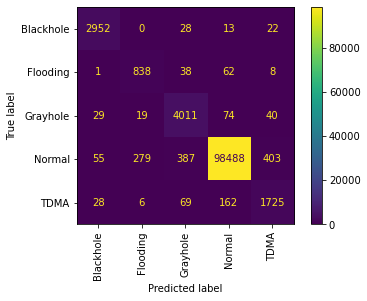

In [488]:
plot_confusion_matrix(estimator = knn,X = X_test,y_true = y_test,xticks_rotation = 'vertical')

In [ ]:
knn_cv_scores = cross_val_score(estimator = knn,cv = 10,X = X_train,y = y_train,error_score = True)
print("KNN Cross Val Score : ",knn_cv_scores.mean())

In [1]:
# Detection/ Inference Speed

@Calc_Detection_Speed
def ds_KNN():
    return knn

ds_KNN()

### log knn metrics to wandb

In [ ]:
wandb.sklearn.plot_classifier()

## Decision Tree Classifier

In [40]:
# Undersampling
X_train_,y_train_ = undersample_all.fit_resample(X_train,y_train)

In [41]:
dt = DecisionTreeClassifier(max_depth = 10,random_state=111)
dt

DecisionTreeClassifier(max_depth=10, random_state=111)

In [42]:
dt.fit(X_train_,y_train_)

DecisionTreeClassifier(max_depth=10, random_state=111)

In [43]:
dt.score(X_test,y_test)

0.9740470397404704

In [44]:
dt_cv_scores = cross_val_score(estimator = dt,cv = 10,X = X_train_,y = y_train_,error_score = True)
dt_cv_scores.mean()

0.9726696832579185

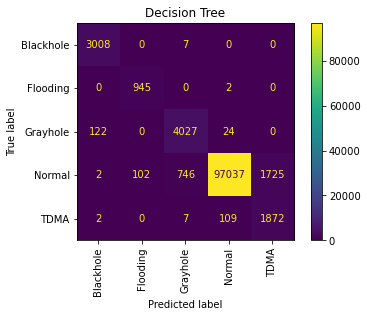

In [45]:
plot_confusion_matrix(estimator = dt,X = X_test,y_true = y_test,xticks_rotation = 'vertical')
plt.title("Decision Tree");

In [48]:
dt_y_pred = dt.predict(X_test)
dt_y_probas = dt.predict_proba(X_test)

In [50]:
precision,recall,fscore,support = precision_recall_fscore_support(y_true = y_test,y_pred = dt_y_pred)

In [51]:
print("Precision : ",precision,"\n")
print("recall : ",recall,"\n")
print("fscore : ",fscore,"\n")
print("support : ",support,"\n")

Precision :  [0.95979579 0.9025788  0.84123668 0.99861071 0.52043369] 

recall :  [0.99767828 0.99788807 0.96501318 0.9741497  0.94070352] 

fscore :  [0.97837047 0.94784353 0.89888393 0.98622856 0.67012708] 

support :  [ 3015   947  4173 99612  1990] 



In [53]:
prfs_metrics(y_true = y_test,y_pred = dt_y_pred)

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998611,0.841237,0.902579,0.520434,0.959796
recall,0.974150,0.965013,0.997888,0.940704,0.997678
F-measure,0.986229,0.898884,0.947844,0.670127,0.978370
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [54]:
dt_steps = [('sampling',borderline_oversample),('model',dt)]
dt_pipeline = Pipeline(steps = dt_steps)
dt_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [55]:
dt_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 DecisionTreeClassifier(max_depth=10, random_state=111))])

In [59]:
dt_pipe_y_pred = dt_pipeline.predict(X_test)
dt_pipe_y_probas = dt_pipeline.predict_proba(X_test)

In [66]:
"""Testing for Overfitting """

print("Decision Tree Accuracy")

print("Accuracy (Test set) : ", dt_pipeline.score(X_test,y_test))
print("Accuracy (Train set) : ", dt_pipeline.score(X_train,y_train))


Decision Tree Accuracy
Accuracy (Test set) :  0.9878618879685065
Accuracy (Train set) :  0.9881195543075403


In [86]:
dt_pipeline_cv_scores = cross_val_score(estimator = dt_pipeline,cv = 10,X = X_train,y = y_train,error_score = True)
print("Decision Tree Cross Val Score : ",dt_pipeline_cv_scores.mean())

Decision Tree Cross Val Score :  0.986338665834871


In [65]:
prfs_metrics(y_test,dt_pipe_y_pred)

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998653,0.855427,0.902913,0.859963,0.964579
recall,0.989861,0.972682,0.982049,0.941206,0.975456
F-measure,0.994237,0.910294,0.940819,0.898752,0.969987
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [62]:
dt_roc_auc = roc_auc_score(y_test,dt_pipe_y_probas, multi_class='ovr')
print("Decision Tree RoC/AuC Score : {}".format(dt_roc_auc))

Decision Tree RoC/AuC Score : 0.993111660139434


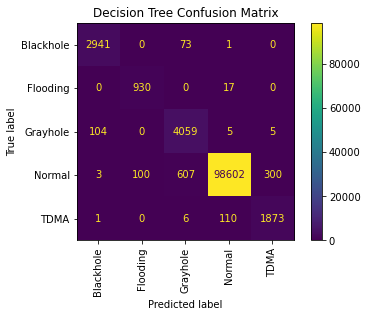

In [63]:
#confusion matrix
plot_confusion_matrix(estimator = dt_pipeline,X = X_test,y_true = y_test,xticks_rotation = 'vertical');
plt.title("Decision Tree Confusion Matrix");

In [463]:
# Detection/ Inference Speed


@Calc_Detection_Speed
def ds_Decision_Tree():
    return dt_pipeline

ds_Decision_Tree()

'Decision TreeClassifier has an average speed of : 0.02511101484298706'

### Log decision tree metrics to wandb

In [ ]:
# wandb.init(group="Decision Tree", job_type="eval")
# dt_run = wandb.init(project = 'wsn-intrusion-detection',entity = 'mk-armah',name = 'Decision Tree')

In [59]:
# wandb.sklearn.plot_feature_importances(dt, X_train.columns)

In [60]:
# wandb.sklearn.plot_summary_metrics(dt, X_train, y_train, X_test, y_test)

In [462]:
# wandb.sklearn.plot_classifier(dt_pipeline, 
#                               X_train, X_test, 
#                               y_train, y_test, 
#                               y_pred, dt_pipe_y_probas, 
#                               labels = y_test.unique(), 
#                               is_binary=False,
#                               model_name='Decision Tree')

# Naive Bayes

In [67]:
nb = GaussianNB()

In [68]:
nb.fit(X_train,y_train)

GaussianNB()

In [69]:
nb.score(X_test,y_test)

0.855326826867875

In [70]:
nb_cv_scores = cross_val_score(estimator = nb,cv = 10,X = X_train,y = y_train,error_score = True)
nb_cv_scores.mean()

0.8538142789987268

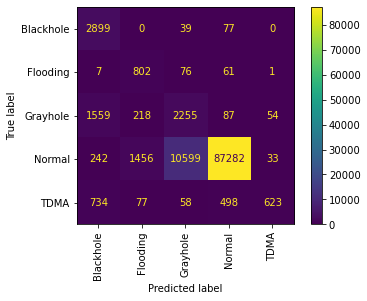

In [71]:
plot_confusion_matrix(estimator = nb,X = X_test,y_true = y_test,xticks_rotation = 'vertical');

In [72]:
y_test.unique()

array(['Normal', 'Grayhole', 'Flooding', 'TDMA', 'Blackhole'],
      dtype=object)

In [73]:
nb_y_pred = nb.predict(X_test)
nb_y_probas = nb.predict_proba(X_test)

In [74]:
precision,recall,fscore,support = precision_recall_fscore_support(y_true = y_test,y_pred = nb_y_pred)

In [75]:
nb_metrics = prfs_metrics(y_true = y_test,y_pred = nb_y_pred)

nb_metrics

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.991785,0.173102,0.314140,0.876231,0.532806
recall,0.876220,0.540379,0.846885,0.313065,0.961526
F-measure,0.930427,0.262209,0.458286,0.461311,0.685667
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [76]:
nb_steps = [('sampling',borderline_oversample),('scaler',MinMaxScaler()),('model',nb)]
nb_pipeline = Pipeline(steps = nb_steps)
nb_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('scaler', MinMaxScaler()), ('model', GaussianNB())])

In [77]:
nb_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('scaler', MinMaxScaler()), ('model', GaussianNB())])

In [78]:
nb_cv_scores = cross_val_score(estimator = nb_pipeline,cv = 10,X = X_train,y = y_train,error_score = True)
print("Naive Bayes Cross Val Score : ",nb_cv_scores.mean())

0.9515213690747488

In [79]:
nb_acc = nb_pipeline.score(X_test,y_test)
print("Naive Bayes Accuracy : {}".format(nb_acc))

Naive Bayes Accuracy : 0.9518758486198821


In [80]:
nb_pipeline_y_probas = nb_pipeline.predict_proba(X_test)
nb_pipeline_y_pred = nb_pipeline.predict(X_test)

In [81]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", nb_pipeline.score(X_test,y_test))
print("Accuracy (Train set) : ", nb_pipeline.score(X_train,y_train))

Accuracy (Test set) :  0.9518758486198821
Accuracy (Train set) :  0.9514042124420525


In [82]:
nb_roc_auc = roc_auc_score(y_test,nb_pipeline_y_probas, multi_class='ovr')
print("Naive Bayes RoC/AuC Score : {}".format(nb_roc_auc))

Naive Bayes RoC/AuC Score : 0.9705083677860873


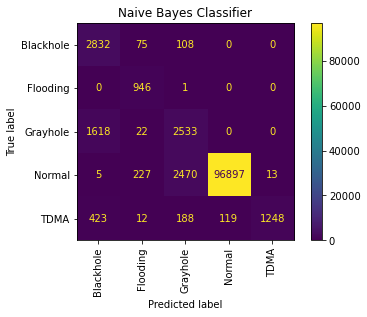

In [83]:
plot_confusion_matrix(estimator = nb_pipeline,X = X_test,y_true = y_test,xticks_rotation = 'vertical');
plt.title("Naive Bayes Classifier");

In [103]:
nb_metrics = prfs_metrics(y_true = y_test,y_pred = nb_pipeline_y_pred)

nb_metrics

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998773,0.477925,0.737910,0.989691,0.580566
recall,0.972744,0.606997,0.998944,0.627136,0.939303
F-measure,0.985587,0.534783,0.848811,0.767764,0.717598
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [461]:
# Detection/ Inference Speed

@Calc_Detection_Speed
def ds_Naive_Bayes():
    return dt_pipeline

ds_Naive_Bayes()

'Naive BayesClassifier has an average speed of : 0.02283346891403198'

### log naive bayes metrics to wandb

In [63]:
wandb.init(group="Naive Bayes", job_type="eval")

# nb_run = wandb.init(project = 'wsn-intrusion-detection',entity = 'mk-armah',name = 'Naive Bayes')

In [79]:
#precision, recall,fscore,support

wandb.sklearn.plot_summary_metrics(nb, X_train, y_train, X_test, y_test)

In [ ]:
nb_y_probas = nb.predict_proba(X_test)

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, y_probas, 
                              labels, 
                              is_binary= False
                              model_name='Naive Bayes')

# Ensemble Models

## Bagging

### Random Forest Classifier

In [44]:
rf = RandomForestClassifier(n_estimators = 400,random_state = 42)
rf_steps = [('sampling',borderline_oversample),('model',rf)]

In [45]:
rf_pipeline = Pipeline(steps = rf_steps)
rf_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 RandomForestClassifier(n_estimators=400, random_state=42))])

In [46]:
rf_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 RandomForestClassifier(n_estimators=400, random_state=42))])

In [99]:
rf_pipeline_cv_scores = cross_val_score(estimator = rf_pipeline,cv = 10,X = X_train,y = y_train,error_score = 'raise')
print("Random Forest Cross Validation Score : {}".format(rf_cv_scores.mean()))

Random Forest Cross Validation Score : 0.9960203231756347


In [90]:
rf_accuracy = rf_pipeline.score(X_test,y_test)
print("Random Forest Accuracy : {}".format(rf_accuracy))

Random Forest Accuracy : 0.9960450896233722


In [91]:
rf_roc_auc = roc_auc_score(y_test, rf_pipeline.predict_proba(X_test), multi_class='ovr')
print("Random Forest RoC/AuC Score : {}".format(rf_roc_auc))

Random Forest RoC/AuC Score : 0.9965182579976151


In [101]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", rf_pipeline.score(X_test,y_test))
print("Accuracy (Train set) : ", rf_pipeline.score(X_train,y_train))

Accuracy (Test set) :  0.9960450896233722
Accuracy (Train set) :  0.9999960945280433


In [94]:
rf_y_pred = rf_pipeline.predict(X_test)
rf_y_probas = rf_pipeline.predict_proba(X_test)

In [100]:
rf_metrics = prfs_metrics(y_true = y_test,y_pred = rf_y_pred)

rf_metrics

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998663,0.975437,0.907603,0.964876,0.989148
recall,0.997410,0.989696,0.995776,0.938693,0.997678
F-measure,0.998036,0.982515,0.949648,0.951605,0.993395
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


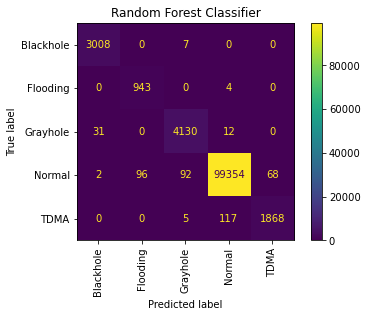

In [47]:
plot_confusion_matrix(estimator = rf_pipeline,X = X_test,y_true = y_test,xticks_rotation = 'vertical');
plt.title("Random Forest Classifier");

In [464]:
#Random Forest Inference Speed

@Calc_Detection_Speed
def ds_Random_Forest():
    return rf_pipeline

ds_Random_Forest()

'Random ForestClassifier has an average speed of : 7.327415909767151'

### wandb random forest metrics to wandb

In [82]:
wandb.init(group="Random Forest", job_type="eval")

#rf_run = wandb.init(project = 'wsn-intrusion-detection',entity = 'mk-armah',name = 'Random Forest')

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, rf_y_probas, 
                              labels, 
                              is_binary = False,
                              model_name = 'Random Forest')

## Boosting

In [30]:
adaboost = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth = 10),n_estimators = 50,random_state = 42)
adaboost

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                   random_state=42)

In [105]:
adaboost.fit(X_train,y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                   random_state=42)

In [79]:
adaboost_pipeline = Pipeline([('sampling',borderline_oversample),('model',adaboost)])
adaboost_pipeline

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 Pipeline(steps=[('sampling',
                                  BorderlineSMOTE(random_state=111)),
                                 ('model',
                                  AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                                     random_state=42))]))])

In [80]:
adaboost_pipeline.fit(X_train,y_train)

Pipeline(steps=[('sampling', BorderlineSMOTE(random_state=111)),
                ('model',
                 Pipeline(steps=[('sampling',
                                  BorderlineSMOTE(random_state=111)),
                                 ('model',
                                  AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                                     random_state=42))]))])

In [81]:
import joblib

In [199]:
adaboost_cv_scores = cross_val_score(estimator = adaboost_pipeline,X = X_train,y = y_train,cv = 10,error_score= 'raise')
adaboost_cv_scores.mean()

0.9870806865939858

In [107]:
adaboost_pipeline.score(X_test,y_test)

0.9965280625495503

In [108]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", adaboost_pipeline.score(X_test,y_test))
print("Accuracy (Train set) : ", adaboost_pipeline.score(X_train,y_train))

Accuracy (Test set) :  0.9965280625495503
Accuracy (Train set) :  0.999320447879524


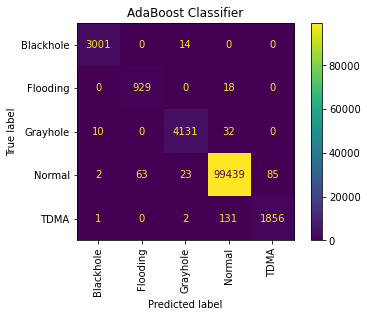

In [111]:
plot_confusion_matrix(estimator = adaboost_pipeline,X = X_test,y_true = y_test,xticks_rotation='vertical');
plt.title("AdaBoost Classifier");

Accuracy (Test set) :  0.9965280625495503
Accuracy (Train set) :  0.999320447879524


In [154]:
adaboost_pipeline_cv_scores = cross_val_score(estimator = adaboost_pipeline,cv = 10,X = X_train,y = y_train,error_score = 'raise')
print("Adaboost Classifier Cross Validation Score : {}".format(adaboost_pipeline_cv_scores.mean()))

Adaboost Classifier Cross Validation Score : 0.9866432724840856


In [ ]:
adaboost_roc_auc = roc_auc_score(y_test,adaboost_pipeline_y_probas, multi_class='ovr')
print("Adaboost Classifier RoC/AuC Score : {}".format(nb_roc_auc))

In [115]:
adaboost_pipeline_y_pred = adaboost_pipeline.predict(X_test)
adaboost_pipeline_y_probas = adaboost_pipeline.predict_proba(X_test)

In [116]:
adaboost_pipeline_metrics = prfs_metrics(y_true = y_test,y_pred = adaboost_pipeline_y_pred)
adaboost_pipeline_metrics

,Normal,Grayhole,Flooding,TDMA,Blackhole
precision,0.998183,0.990647,0.936492,0.956208,0.995687
recall,0.998263,0.989935,0.980993,0.932663,0.995357
F-measure,0.998223,0.990291,0.958226,0.944289,0.995522
support,99612.000000,4173.000000,947.000000,1990.000000,3015.000000


In [470]:
@Calc_Detection_Speed
def ds_AdaBoost():
    return adaboost_pipeline

ds_AdaBoost()

'AdaBoostClassifier has an average speed of : 1.604s'

### log Adaboost to wandb

In [ ]:
wandb.init(group="Adaboost", job_type="eval")

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, adaboost_pipeline_y_probas, 
                              labels, 
                              is_binary= False,
                              model_name='Adaboost')

In [83]:
joblib.dump(adaboost_pipeline,"models/adaboost.chael") #saving model

['models/adaboost.chael']

In [84]:
adaboost_model = joblib.load('models/adaboost.chael')

In [85]:
adaboost_model.predict(X_test)

array(['Normal', 'Normal', 'Normal', ..., 'Normal', 'Normal', 'Normal'],
      dtype=object)

In [86]:
X_train.dtypes

is_ch                int64
dist_to_ch         float64
adv_s                int64
adv_r                int64
join_s               int64
join_r               int64
sch_s                int64
sch_r                int64
rank                 int64
data_s               int64
data_r               int64
data_sent_to_bs      int64
dist_ch_to_bs      float64
send_code_           int64
expaned_energy     float64
dtype: object

## Stacking

In [117]:
xgb = XGBClassifier()
xgb.fit(X_train,y_train)

[15:47:22] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [118]:
xgb.score(X_train,y_train)

0.9988361693568859

In [119]:
xgb.score(X_test,y_test)

0.9972479655904571

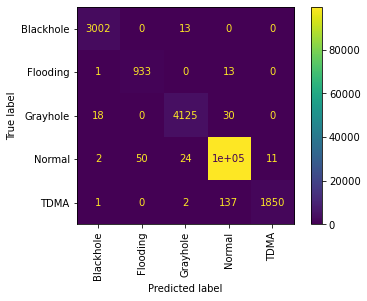

In [120]:
plot_confusion_matrix(estimator = xgb,X = X_test,y_true = y_test,xticks_rotation='vertical');

In [157]:
le = LabelEncoder()
y_train_le = le.fit_transform(y_train)

In [158]:
stk_clf = StackingClassifier(classifiers = [dt,adaboost,rf],
                       meta_classifier = XGBClassifier(),
                        use_features_in_secondary = True)

In [159]:
stk_clf.fit(X_train,y_train_le)

[18:54:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


StackingClassifier(classifiers=[DecisionTreeClassifier(max_depth=10,
                                                       random_state=111),
                                AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10),
                                                   random_state=42),
                                RandomForestClassifier(n_estimators=400,
                                                       random_state=42)],
                   meta_classifier=XGBClassifier(base_score=None, booster=None,
                                                 colsample_bylevel=None,
                                                 colsample_bynode=None,
                                                 colsample_bytr...
                                                 learning_rate=None,
                                                 max_delta_step=None,
                                                 max_depth=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=100, n_jobs=None,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=None,
                                                 reg_alpha=None,
                                                 reg_lambda=None,
                                                 scale_pos_weight=None,
                                                 subsample=None,
                                                 tree_method=None,
                                                 validate_parameters=None,
                                                 verbosity=None),
                   use_features_in_secondary=True)

In [161]:
stk_clf_cv_scores = cross_val_score(estimator = stk_clf,X = X_train,y = y_train_le,cv = 10,error_score = 'raise')
print("Stacking Classifier Cross Validation Score : {}".format(stk_clf_cv_scores.mean())

[19:04:13] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:06:57] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:09:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:13:14] WARNI

0.9969146751709465

In [172]:
y_test_le = le.transform(y_test)

In [173]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", stk_clf.score(X_test,y_test_le))
print("Accuracy (Train set) : ", stk_clf.score(X_train,y_train_le))

Accuracy (Test set) :  0.9971568386232538
Accuracy (Train set) :  0.9999960945280433


In [216]:
le.classes_

array(['Blackhole', 'Flooding', 'Grayhole', 'Normal', 'TDMA'],
      dtype=object)

In [218]:
?plot_confusion_matrix

Text(0.5, 1.0, 'Stacking Classifier')

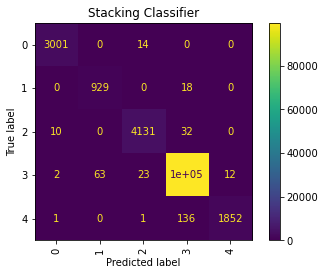

In [471]:
plot_confusion_matrix(estimator = stk_clf,X = X_test,y_true = y_test_le,xticks_rotation='vertical');
plt.title("Stacking Classifier")

In [ ]:
stk_clf_roc_auc = roc_auc_score(y_test,stk_clf, multi_class='ovr')
print("Stacking Classifier RoC/AuC Score : {}".format(stk_clf_roc_auc))

In [ ]:
prfs_metrics(y_true = y_test,y_pred = dt_y_pred)

In [183]:
labels = list(le.classes_)
labels

['Blackhole', 'Flooding', 'Grayhole', 'Normal', 'TDMA']

In [472]:
@Calc_Detection_Speed
def ds_Stacking():
    return stk_clf

ds_Stacking()

'StackingClassifier has an average speed of : 7.074s'

### log stacking classifier to wandb

In [249]:
le.classes_

array(['Blackhole', 'Flooding', 'Grayhole', 'Normal', 'TDMA'],
      dtype=object)

In [ ]:
wandb.init(group = "Stacking Classifier", job_type="eval")

In [ ]:
stk_y_probas = stk.predict_probas(y_test_le)

In [ ]:
wandb.sklearn.plot_classifier(rf_pipeline, 
                              X_train, X_test, 
                              y_train, y_test, 
                              y_pred, rf_y_probas, 
                              labels, 
                              is_binary=False,
                              model_name='Stacking Classifier')

## Neural Network

In [48]:
X_train_nn = X_train.values.astype(np.float32)
le = LabelEncoder()
y_train_nn = le.fit_transform(y_train).astype(np.int64)

y_test_nn = le.transform(y_test.values)

In [38]:
class wsNet(nn.Module):
    def __init__(self, num_units=10):
        super(wsNet, self).__init__()
         
        self.relu =nn.ReLU()
        self.softmax = nn.Softmax()
        self.first_dense = nn.Linear(17, num_units)
        self.dropout = nn.Dropout(0.2)
        self.second_dense = nn.Linear(num_units, 10)
        self.output = nn.Linear(10, 5)
        

    def forward(self, X, **kwargs):
        X = self.first_dense(X)
        X = self.relu(X)
        X = self.dropout(X)
        X = self.second_dense(X)
        X = self.output(X)
        X = self.softmax(X)
        return X

In [39]:
wsnet_model = NeuralNetClassifier(
    wsNet,
    max_epochs=30,
    criterion=nn.CrossEntropyLoss(),
    lr=0.1,
    # Shuffle training data on each epoch
    iterator_train__shuffle=True,
)

In [40]:
wsnet_pipe = Pipeline([
        ('sampling_strategy',BorderlineSMOTE()),
        ('scaler',MinMaxScaler()),
        ('model',wsnet_model)
])

In [41]:
wsnet_pipe

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('scaler', MinMaxScaler()),
                ('model',
                 <class 'skorch.classifier.NeuralNetClassifier'>[uninitialized](
  module=<class '__main__.wsNet'>,
))])

In [42]:
wsnet_pipe.fit(X_train_nn, y_train_nn)

  epoch    train_loss    valid_acc    valid_loss      dur
-------  ------------  -----------  ------------  -------
      1        1.2571       0.7517        1.1556  17.5972
      2        1.1465       0.9178        1.0152  15.1002
      3        1.0172       0.9331        0.9773  14.2470
      4        0.9952       0.9290        0.9784  14.2880
      5        0.9871       0.9394        0.9679  14.8430
      6        0.9837       0.9392        0.9671  14.7505
      7        0.9816       0.9409        0.9651  16.8100
      8        0.9796       0.9411        0.9649  17.4110
      9        0.9783       0.9414        0.9640  18.7720
     10        0.9776       0.9396        0.9665  19.0860
     11        0.9772       0.9129        0.9909  18.4180
     12        0.9768       0.9416        0.9638  18.3190
     13        0.9768       0.9425        0.9629  18.8596
     14        0.9766       0.9432        0.9620  18.5750
     15        0.9763       0.9424        0.9629  18.6670
     16       

Pipeline(steps=[('sampling_strategy', BorderlineSMOTE()),
                ('scaler', MinMaxScaler()),
                ('model',
                 <class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=wsNet(
    (relu): ReLU()
    (softmax): Softmax(dim=None)
    (first_dense): Linear(in_features=17, out_features=10, bias=True)
    (dropout): Dropout(p=0.2, inplace=False)
    (second_dense): Linear(in_features=10, out_features=10, bias=True)
    (output): Linear(in_features=10, out_features=5, bias=True)
  ),
))])

In [86]:
X_test_nn = X_test.values.astype(np.float32)
y_proba_nn = wsnet_pipe.predict_proba(X_test_nn)
y_pred_nn = wsnet_pipe.predict(X_test_nn)

In [52]:
wsnet_pipe.score(X_test.values.astype(np.float32),y_test_nn)

0.9586556949798154

In [53]:
"""Testing for Overfitting """

print("Accuracy (Test set) : ", wsnet_pipe.score(X_test.values.astype(np.float32),y_test_nn))
print("Accuracy (Train set) : ", wsnet_pipe.score(X_train_nn,y_train_nn))

Accuracy (Test set) :  0.9586556949798154
Accuracy (Train set) :  0.9580864749600666


In [316]:
#------------------------------- computationally expensive operation --------------------------------------


# wsnet_pipe_cv_scores = cross_val_score(estimator = wsnet_pipe,cv = 10,X = X_train_nn,y = y_train_nn,error_score = 'raise')
# print("Artificial Neural Network Cross Validation Score : {}".format(wsnet_pipe_cv_scores.mean()))

In [319]:
from sklearn.metrics import confusion_matrix

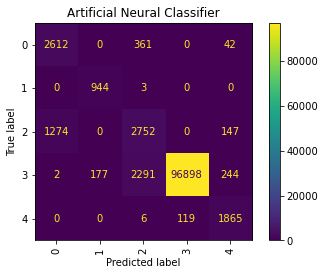

In [334]:
plot_confusion_matrix(estimator = wsnet_pipe,X = X_test.values.astype(np.float32),
                      y_true = y_test_nn,xticks_rotation = 'vertical');

plt.title("Artificial Neural Classifier");

In [83]:
_ = pd.DataFrame({"truelabel":le.inverse_transform(y_test_nn),"encodedlabel":y_test_nn})
print("True labels : ", _.truelabel.unique())
print("Encoded labels : ", _.encodedlabel.unique())

True labels :  ['Normal' 'Grayhole' 'Flooding' 'TDMA' 'Blackhole']
Encoded labels :  [3 2 1 4 0]


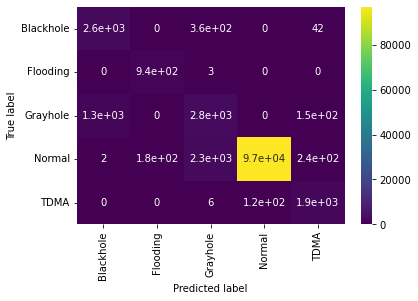

In [345]:
sns.heatmap(confusion_matrix(y_true = y_test_nn,y_pred = y_pred_nn),
            cmap = 'viridis',annot = True,xticklabels = le.classes_,
           yticklabels = le.classes_);

plt.xlabel('Predicted label');
plt.xticks(rotation = 90);
plt.ylabel('True label');

In [61]:
y_pred_nn

array([3, 3, 3, ..., 3, 3, 3], dtype=int64)

In [63]:
y_test_nn

array([3, 3, 3, ..., 3, 3, 3])

In [76]:
prfs_nn = prfs_metrics(y_true = y_test_nn,y_pred = y_pred_nn)
prfs_nn.columns= le.classes_
prfs_nn

,Blackhole,Flooding,Grayhole,Normal,TDMA
precision,0.643839,0.836428,0.508233,0.998774,0.924950
recall,0.979104,0.998944,0.606518,0.972875,0.935176
F-measure,0.776842,0.910491,0.553043,0.985654,0.930035
support,3015.000000,947.000000,4173.000000,99612.000000,1990.000000


In [87]:
wsnet_roc_auc = roc_auc_score(y_test_nn,y_proba_nn, multi_class ='ovr')
print("Neural Network RoC/AuC Score : {}".format(wsnet_roc_auc))

Neural Network RoC/AuC Score : 0.983316615741052


## Neural Net Detection Speed Analysis

In [484]:
@Calc_Detection_Speed
def ds_Neural_Network():
    return wsnet_pipe

ds_Neural_Network()

'Neural NetworkClassifier has an average speed of : 1.343s'